In [16]:
import glob
import pandas as pd
from ML2_lib import RV_SGDAve
from ML2_lib import loss
from ML2_lib import plot_set
import numpy as np
import datetime
import pickle
import os

from tqdm import tqdm_notebook as tqdm

In [8]:
files = glob.glob("../remote_exp/remote_save_result/Ellipsoid_2d_trajectory11:02:11:49:32/*")
len(files)

45

In [9]:
def sgd_to_ave(x):
    hoge = []
    for i in range(x.shape[0]):
        if i == 0:
            hoge.append(x[0])
        else:
            hoge.append(np.mean(x[0:i + 1], axis=0))
    return hoge

In [10]:
def k_sgd_to_ave(k_core_list):
    hoge = []
    for i in k_core_list:
        fuga = []
        for j in i:
            fuga.append(sgd_to_ave(j))
        hoge.append(np.array(fuga))
    return hoge


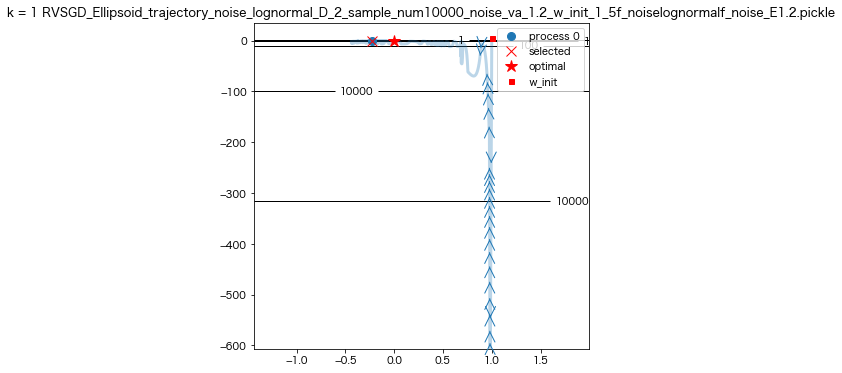

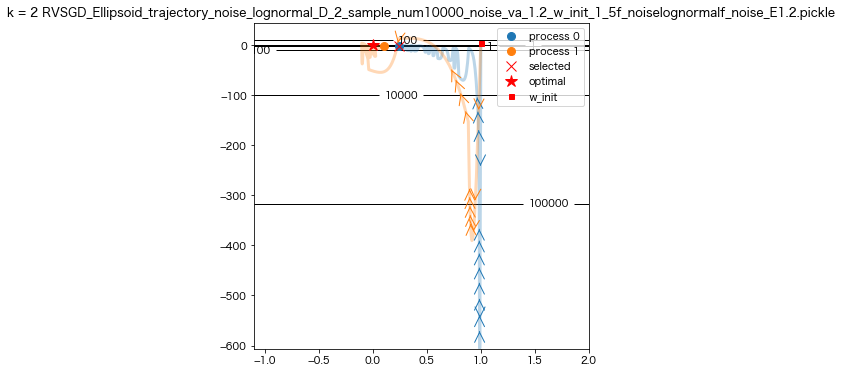

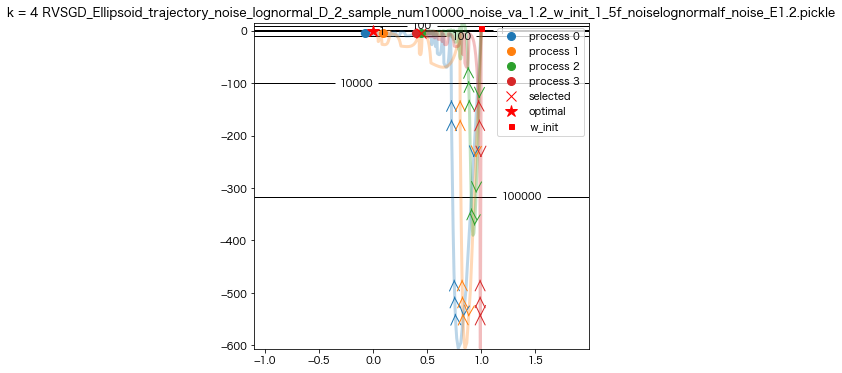

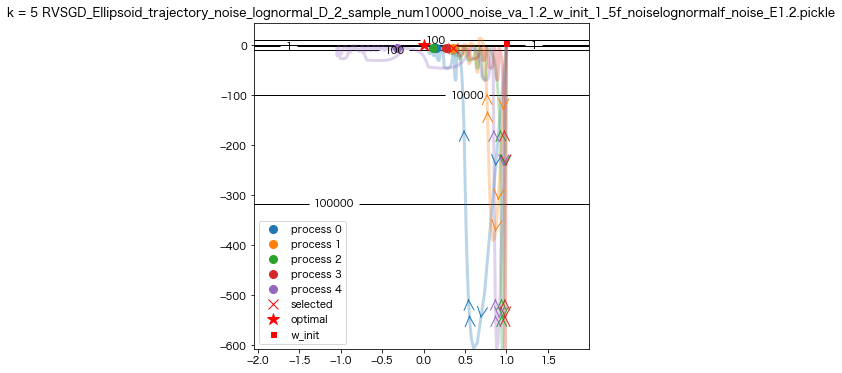

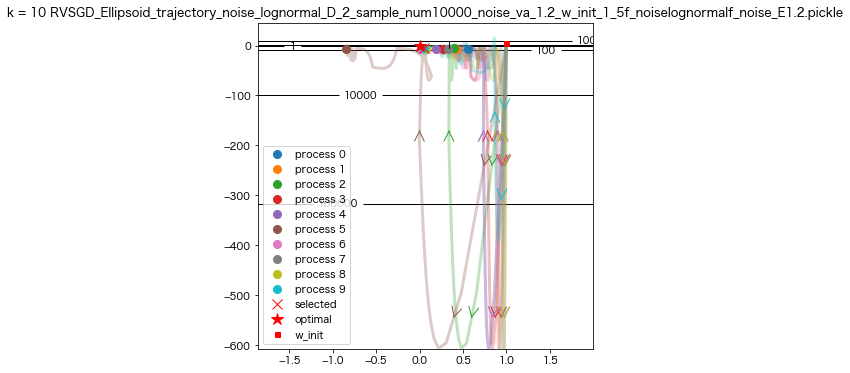

...

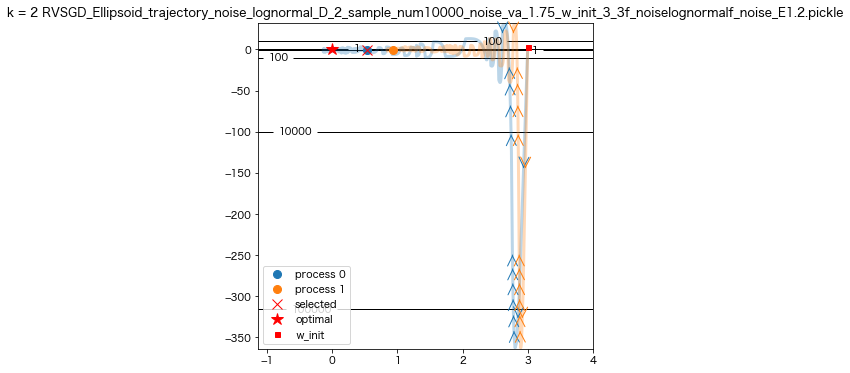

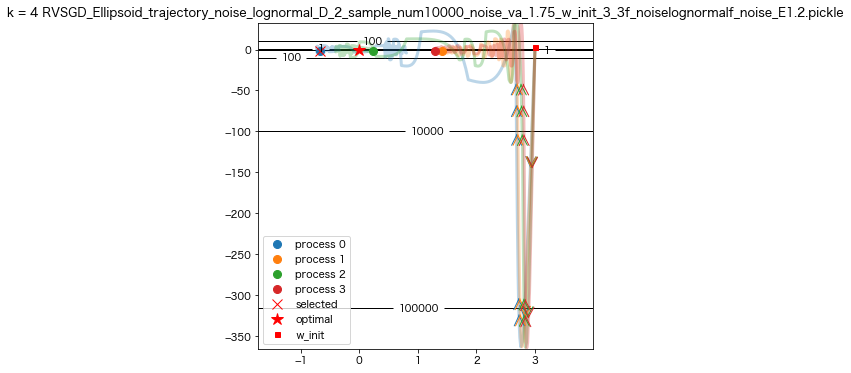

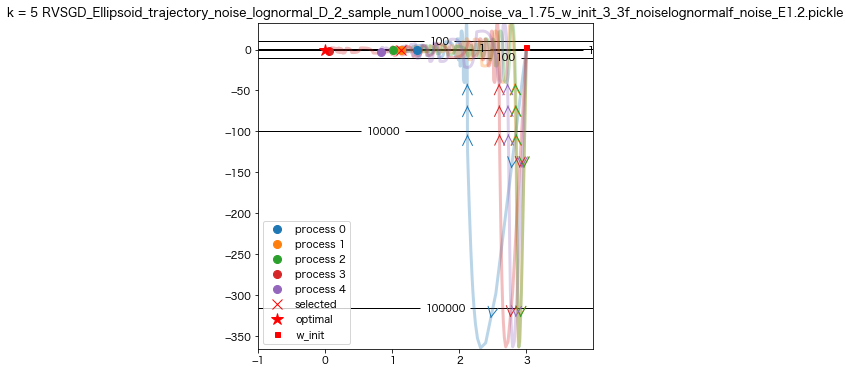

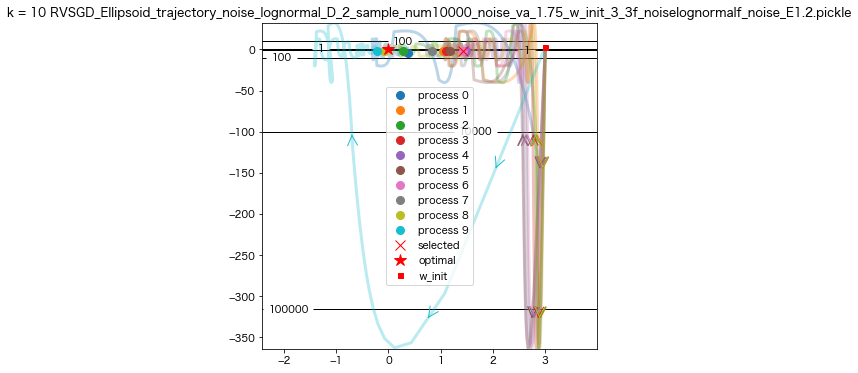

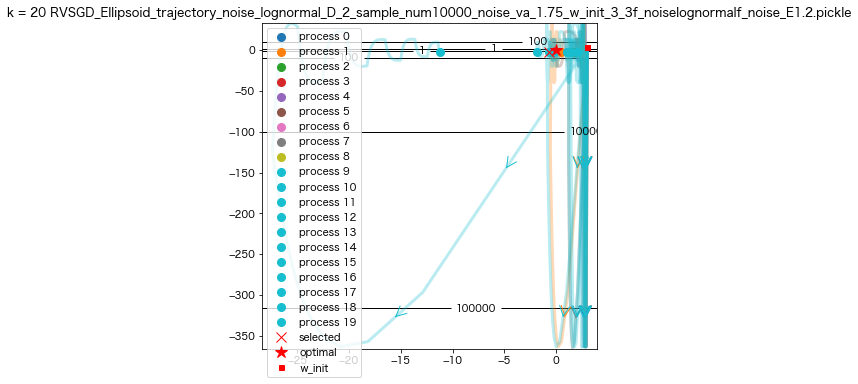

In [18]:
d = {}
n = 10000
noise = "lognormal"
k_list = [1, 2, 4, 5, 10, 20]
son = loss.Ellipsoid(d=2, noise_type=noise, E_var=1.75)
now = datetime.datetime.now()
new_dir_path_recursive = f"../save_result_data/{son.name}total_2d_trajectory_image_{now:%m:%d:%H:%M:%S}"
os.makedirs(new_dir_path_recursive)
for file in files:
    content = file.split("/")[-1]
    title = f"{content}"

    with open(file, mode="rb") as f:
        d = pickle.load(f)
    k_core_list, k_selected_index = d["k_core_list"], d["k_selected_index"]
    k_core_list_ave = k_sgd_to_ave(k_core_list)
    plot_set.multiple_w_value_2d_k_candidates_contour(k_list=k_list, k_list_core_store=k_core_list_ave, _t_max=n,
                                                      k_selected_index=k_selected_index, f=son, title=title,folder_title=new_dir_path_recursive,
                                                      levels=[1, 100, 10000, 100000, 1000000,10000000],saving_png=False)

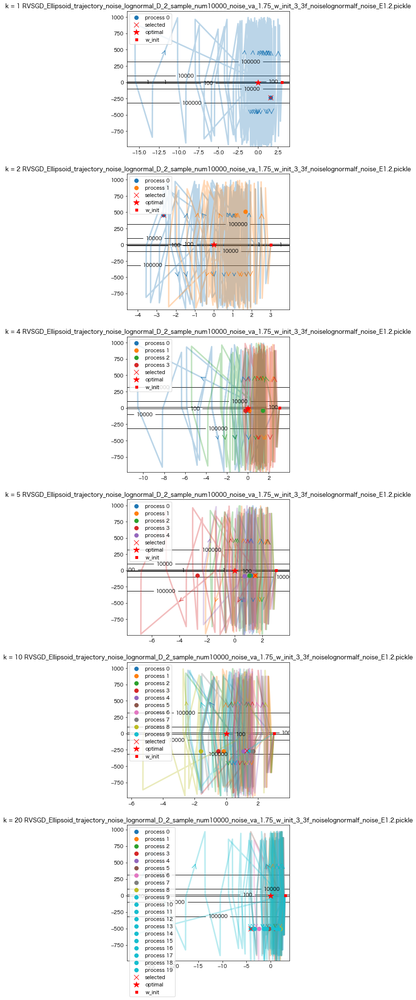

In [13]:

d = {}
n = 10000
noise = "lognormal"
k_list = [1, 2, 4, 5, 10, 20]
son = loss.Ellipsoid(d=2, noise_type=noise, E_var=1.75)
content = file.split("/")[-1]
title = f"{content}"

with open(file, mode="rb") as f:
    d = pickle.load(f)
k_core_list, k_selected_index = d["k_core_list"], d["k_selected_index"]
plot_set.multiple_w_value_2d_k_candidates_contour(k_list=k_list, k_list_core_store=k_core_list, _t_max=n,
                                                  k_selected_index=k_selected_index, f=son, title=title,
                                                  levels=[1, 100, 10000, 100000, 1000000,10000000])